# <center>Build an Anomaly Detection Model using PyCaret</center>


![Anomaly](images/jessica-ruscello-DoSDQvzjeH0-unsplash.jpg)

Photo by <a href="https://unsplash.com/@jruscello?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Jessica Ruscello</a> on <a href="https://unsplash.com/s/photos/different?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  
  

![PyCaret](images/pycaret2.3.PNG)

[source](https://pycaret.readthedocs.io/en/latest/index.html)

# Task 1 : Introduction and setup of the environment

![Anomaly](images/anomaly.png)

source: Goldstein M, Uchida S (2016) A Comparative Evaluation of Unsupervised Anomaly Detection Algorithms for Multivariate Data. PLo

## Import Librairies


In [1]:
# import librairies
import pandas as pd
import seaborn as sns
from pandas_profiling import ProfileReport

from pycaret.datasets import get_data

from pycaret.anomaly import *

<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject


In [2]:
# pycaret version
pycaret.__version__

'2.3.3'

# Task 2 : Load and Prepare Data

In [3]:
# Load data
df = get_data('anomaly')

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754


In [4]:
#
df.shape

(1000, 10)

In [5]:
# list the variables:
df.dtypes

Col1     float64
Col2     float64
Col3     float64
Col4     float64
Col5     float64
Col6     float64
Col7     float64
Col8     float64
Col9     float64
Col10    float64
dtype: object

# Task 3 : Explore Data



In [6]:
# Profile Report
ProfileReport(df)

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.35s/it]


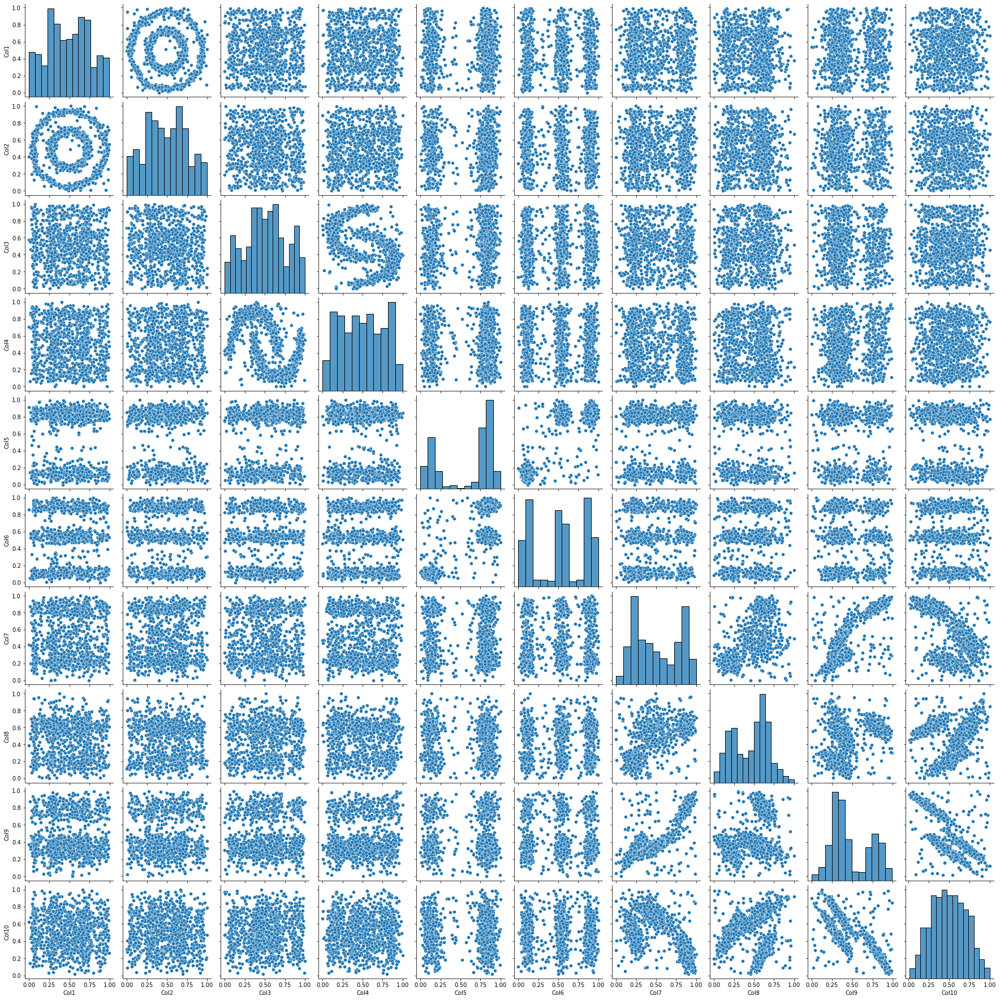

In [7]:
# pairplot
sns.pairplot(df)

# Task 4: Preprocess Data

In [8]:
#
mySetup = setup(data=df, session_id=123)


,Description,Value
0,session_id,123
1,Original Data,"(1000, 10)"
2,Missing Values,False
3,Numeric Features,10
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(1000, 10)"
9,CPU Jobs,-1


# Task 5 : Build Anomaly Detection Model

In [9]:
# List of Models
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [10]:
# Create model using iforest
iforest = create_model('iforest')

In [11]:
print(iforest)

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=123, verbose=0)


In [12]:
# Create Model using knn
knn = create_model('knn')

In [13]:
print(knn)

KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0)


In [14]:
# Assign Model
iforest_result = assign_model(iforest)

In [22]:
iforest_result.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,-0.035865
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,-0.084927
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.025356
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.042415
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,-0.023408


In [20]:
iforest_result.Anomaly.value_counts()

0    950
1     50
Name: Anomaly, dtype: int64

In [ ]:
# Filter on Anomaly


# Task 6 : Evaluate Model

In [23]:
# Plot Model
plot_model(knn)

In [24]:
plot_model(iforest)

# Task 7 : Deploy Model

In [25]:

## Save the final Modele
save_model(knn, 'knn')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  KNN

In [26]:
saved_knn_model = load_model('knn')

Transformation Pipeline and Model Successfully Loaded


In [27]:
print(saved_knn_model)

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
                                fill_value_numerical=None...
                ('fix_perfect', 'passthrough'),
                ('clean_names', Clean_Colum_Names()),
                ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                ('dfs', 'passthrough'), ('pca', 'passthrough'),
                ['trained_model',
                 KNN(algorithm='auto',